# LendingClub Loan Approval

## Model Optimization

### Arya Pambudi Bayuaji

**Dataset:** LendingClub Loan Dataset | **Source:** [Kaggle](https://www.kaggle.com/mirbektoktogaraev/should-this-loan-be-approved-or-denied)

Data berasal dari perusahaan LendingClub 

Lending Club adalah perusahaan pinjaman peer-to-peer yang mencocokkan peminjam dengan investor melalui platform online. Perusahaan ini melayani orang-orang yang membutuhkan pinjaman pribadi antara 1.000 hingga 40.000. Peminjam menerima jumlah penuh dari pinjaman yang diterbitkan dikurangi biaya administrasi yang dibayarkan kepada perusahaan (platform penyedia). Investor mendapatkan keuntungan dari bunga serta diwajibkan membayar Lending Club dengan biaya layanan. Perusahaan membagikan data tentang semua pinjaman yang dikeluarkan melalui platformnya selama periode waktu tertentu.

Misi utama dari Project ini adalah untuk membuat Machine Learning dengan rasio peminjam dapat membayar penuh pinjamannya sebesar 85% yang secara tidak langsung mengurangi resiko credit macet sebelum diterima di LendingClub yang berbasis aplikasi untuk menentukan permintaan pinjaman berdasarkan data historis. 

### Import Data & Library

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler

%matplotlib inline

In [3]:
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

## Training Set Setup

The first step of Model Optimization is to set up the data itself. We will divide the data into two parts. The first part is data that we use to train our model. And the second one is used for evaluating the data. We can divide the data using the train test split.

In [10]:
LCL = pd.read_csv('Clean_Data.csv')
LCL.head()

,Unnamed: 0,loan_amnt,term,int_rate,annual_inc,loan_status,revol_bal
0,0,10000.0,0,11.44,117000.0,1,36369.0
1,1,8000.0,0,11.99,65000.0,1,20131.0
2,2,15600.0,0,10.49,43057.0,1,11987.0
3,3,7200.0,0,6.49,54000.0,1,5472.0
4,4,24375.0,1,17.27,55000.0,0,24584.0


In [11]:
LCL['loan_status'].value_counts(normalize=True)

1    0.801036
0    0.198964
Name: loan_status, dtype: float64

In [5]:
target = LCL.loan_status
LCL.drop(['loan_status','Unnamed: 0'], axis=1, inplace=True)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(LCL, target, test_size=.20, random_state=10)

In [10]:
smote = SMOTE()
X_smo, y_smo = smote.fit_resample(X_train, y_train)

In [11]:
ros = RandomOverSampler()
X_ros, y_ros = ros.fit_resample(X_train, y_train)

In [12]:
rus = RandomUnderSampler()
X_rus, y_rus = rus.fit_resample(X_train, y_train)

## Modelling

Since we have a classification case for our project, we will use some classification algorithm for our model. In this project, we will use six classification models to determine whether a loan can be approved or not.

- Logistic Regression
- Decision Tree
- Random Forest
- Ada Boost
- Gradient Boost
- KNN Classifier


The steps that I'll take in finding a model with hyperparameters and the best score are:
1. Make a Hyperparameters Grid for each model.
2. Do hyperparameter tuning on each model. Some of the models are done by using RandomizedSearchCV to saving time since the two last models have a long fitting time using GridSearchCV.
3. After we have the best hyperparameter for each model, we will compare and evaluate the model using the confusion matrix and ROC-AUC score.
4. Verifying the chosen model with an oversampling method to determine the data will better or not using the oversampling.
5. Save the model using joblib library.

## 1. Logistic Regression

In [13]:
logreg = LogisticRegression()

In [14]:
# Best Grid HyperParameterTuning
logreg_grid = LogisticRegression()
logreg_grid.fit(X_train, y_train)

LogisticRegression()

In [15]:
param_grid_logreg = {
    'max_iter': [100, 200, 300],
}
grid_search_logreg = GridSearchCV(estimator=logreg, param_grid=param_grid_logreg, scoring='roc_auc', cv=5, n_jobs=-1)
grid_search_logreg.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'max_iter': [100, 200, 300]}, scoring='roc_auc')

In [16]:
grid_search_logreg.best_params_

{'max_iter': 100}

In [17]:
logreg_grid = grid_search_logreg.best_estimator_

In [18]:
logreg_grid_pred = logreg_grid.predict(X_test)
logreg_grid_proba = logreg_grid.predict_proba(X_test)

In [19]:
logreg_grid_pred

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [20]:
print(classification_report(y_test, logreg_grid_pred))

              precision    recall  f1-score   support

           0       0.14      0.00      0.00     14422
           1       0.80      1.00      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.47      0.50      0.44     72094
weighted avg       0.67      0.80      0.71     72094



In [21]:
tnlr, fplr, fnlr, tplr = confusion_matrix(y_test, logreg_grid_pred).ravel()
print(confusion_matrix(y_test, logreg_grid_pred))

[[    1 14421]
 [    6 57666]]


In [22]:
logreg_prob = logreg_grid.predict_proba(X_test)
problogreg = logreg_prob[:,1]
fpr_logreg, tpr_logreg, threshold_logreg = roc_curve(y_test, problogreg)
roc_auc_logreg = auc(fpr_logreg, tpr_logreg)

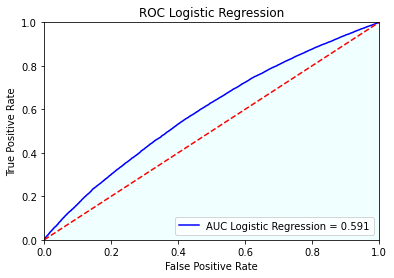

In [23]:
plt.title('ROC Logistic Regression')
plt.plot(fpr_logreg, tpr_logreg, 'blue', label='AUC Logistic Regression = {}'.format(round(roc_auc_logreg,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_logreg, tpr_logreg, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

## 2. Decission Tree

In [24]:
dtc = DecisionTreeClassifier()

In [25]:
# Best Decision Tree Hyperparameter Tuning
dtc_grid = DecisionTreeClassifier(criterion='gini',max_depth=10,min_samples_split=20)
dtc_grid.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_split=20)

In [26]:
param_grid_dtc = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10,15,20],
    'min_samples_split': [2,5,10,20],
}
grid_search_dtc = GridSearchCV(estimator=dtc, param_grid=param_grid_dtc, scoring='roc_auc', cv=5, n_jobs=-1)
grid_search_dtc.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15, 20],
                         'min_samples_split': [2, 5, 10, 20]},
             scoring='roc_auc')

In [27]:
grid_search_dtc.best_params_

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 20}

In [28]:
dtc_grid = grid_search_dtc.best_estimator_

In [29]:
dtc_grid_pred = dtc_grid.predict(X_test)
dtc_grid_proba = dtc_grid.predict_proba(X_test)

In [30]:
dtc_grid_pred

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [31]:
print(classification_report(y_test, dtc_grid_pred))

              precision    recall  f1-score   support

           0       0.48      0.08      0.13     14422
           1       0.81      0.98      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.64      0.53      0.51     72094
weighted avg       0.74      0.80      0.74     72094



In [32]:
tndtc, fpdtc, fndtc, tpdtc = confusion_matrix(y_test, dtc_grid_pred).ravel()
print(confusion_matrix(y_test, dtc_grid_pred))

[[ 1105 13317]
 [ 1218 56454]]


In [33]:
dtc_prob = dtc_grid.predict_proba(X_test)
probdtc = dtc_prob[:,1]
fpr_dtc, tpr_dtc, threshold_dtc = roc_curve(y_test, probdtc)
roc_auc_dtc = auc(fpr_dtc, tpr_dtc)

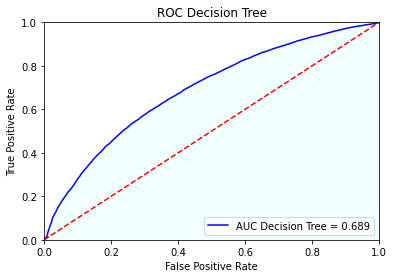

In [34]:
plt.title('ROC Decision Tree')
plt.plot(fpr_dtc, tpr_dtc, 'blue', label='AUC Decision Tree = {}'.format(round(roc_auc_dtc,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_dtc, tpr_dtc, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

### 3. Random Forest

In [35]:
rfc = RandomForestClassifier()

In [36]:
# Best Random Forest Hyperparameter Tuning
rfc_grid = RandomForestClassifier(bootstrap=True, criterion='gini',max_depth=20,min_samples_split=10, n_estimators=200)
rfc_grid.fit(X_train, y_train)

RandomForestClassifier(max_depth=20, min_samples_split=10, n_estimators=200)

In [37]:
param_grid_rfc = {
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy'],
    'max_depth': [10,15,20],
    'min_samples_split': [2,5,10,20],
    'n_estimators': [100,200]
}
grid_search_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid_rfc, scoring='roc_auc', cv=5, n_jobs=-1)
grid_search_rfc.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15, 20],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [100, 200]},
             scoring='roc_auc')

In [38]:
grid_search_rfc.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_split': 2,
 'n_estimators': 200}

In [39]:
rfc_grid = grid_search_rfc.best_estimator_

In [40]:
rfc_grid_pred = rfc_grid.predict(X_test)
rfc_grid_proba = rfc_grid.predict_proba(X_test)

In [41]:
print(classification_report(y_test, rfc_grid_pred))

              precision    recall  f1-score   support

           0       0.55      0.03      0.06     14422
           1       0.80      0.99      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.67      0.51      0.47     72094
weighted avg       0.75      0.80      0.72     72094



In [42]:
tnrfc, fprfc, fnrfc, tprfc = confusion_matrix(y_test, rfc_grid_pred).ravel()
print(confusion_matrix(y_test, rfc_grid_pred))

[[  422 14000]
 [  352 57320]]


In [43]:
rfc_prob = rfc_grid.predict_proba(X_test)
probrfc = rfc_prob[:,1]
fpr_rfc, tpr_rfc, threshold_rfc = roc_curve(y_test, probrfc)
roc_auc_rfc = auc(fpr_rfc, tpr_rfc)

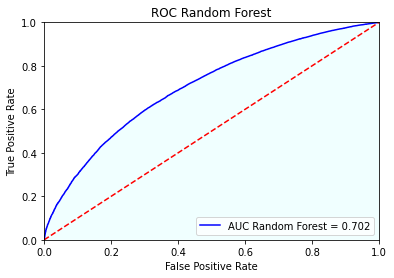

In [44]:
plt.title('ROC Random Forest')
plt.plot(fpr_rfc, tpr_rfc, 'blue', label='AUC Random Forest = {}'.format(round(roc_auc_rfc,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_rfc, tpr_rfc, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

### 4. Ada Boosting

In [45]:
abc = AdaBoostClassifier()

In [46]:
# Best Ada Boost Hyperparameter Tuning
abc_grid = AdaBoostClassifier(learning_rate=1.0, n_estimators=200)
abc_grid.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=200)

In [47]:
param_grid_abc = {
    'n_estimators': [50, 100,200],
    'learning_rate': [0.5, 1.0, 2.0]
}
grid_search_abc = GridSearchCV(estimator=abc, param_grid=param_grid_abc, scoring='roc_auc', cv=5, n_jobs=-1)
grid_search_abc.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.5, 1.0, 2.0],
                         'n_estimators': [50, 100, 200]},
             scoring='roc_auc')

In [48]:
grid_search_abc.best_params_

{'learning_rate': 1.0, 'n_estimators': 200}

In [49]:
abc_grid = grid_search_abc.best_estimator_

In [50]:
abc_grid_pred = abc_grid.predict(X_test)
abc_grid_proba = abc_grid.predict_proba(X_test)

In [51]:
print(classification_report(y_test, abc_grid_pred))

              precision    recall  f1-score   support

           0       0.54      0.02      0.05     14422
           1       0.80      0.99      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.67      0.51      0.47     72094
weighted avg       0.75      0.80      0.72     72094



In [52]:
tnabc, fpabc, fnabc, tpabc = confusion_matrix(y_test, abc_grid_pred).ravel()
print(confusion_matrix(y_test, abc_grid_pred))

[[  350 14072]
 [  300 57372]]


In [53]:
abc_prob = abc_grid.predict_proba(X_test)
probabc = abc_prob[:,1]
fpr_abc, tpr_abc, threshold_abc = roc_curve(y_test, probabc)
roc_auc_abc = auc(fpr_abc, tpr_abc)

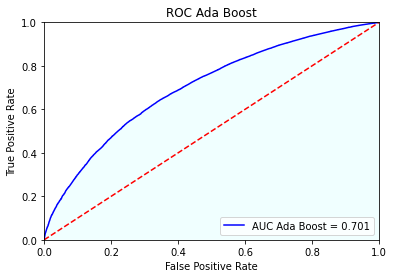

In [54]:
plt.title('ROC Ada Boost')
plt.plot(fpr_abc, tpr_abc, 'blue', label='AUC Ada Boost = {}'.format(round(roc_auc_abc,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_abc, tpr_abc, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

### 5. Gradient Boosting

In [55]:
gbc = GradientBoostingClassifier()

In [56]:
# Best Gradient Boost Hyperparameter Tuning
gbc_random = GradientBoostingClassifier(learning_rate=0.1,max_depth=10, min_samples_split=5 ,n_estimators=100)
gbc_random.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=10, min_samples_split=5)

In [57]:
param_random_gbc = {
    'learning_rate': [0.1,0.5],
    'max_depth' : [3, 10],
    'min_samples_split' : [2,5],
    'n_estimators' : [100,200]
}
random_search_gbc = RandomizedSearchCV(estimator=gbc, param_distributions=param_random_gbc, scoring='roc_auc', n_jobs=-1)
random_search_gbc.fit(X_train, y_train)

RandomizedSearchCV(estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.5],
                                        'max_depth': [3, 10],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc')

In [58]:
random_search_gbc.best_params_

{'n_estimators': 100,
 'min_samples_split': 5,
 'max_depth': 3,
 'learning_rate': 0.5}

In [59]:
gbc_random = random_search_gbc.best_estimator_

In [60]:
gbc_random_pred = gbc_random.predict(X_test)
gbc_random_proba = gbc_random.predict_proba(X_test)

In [61]:
print(classification_report(y_test, gbc_random_pred))

              precision    recall  f1-score   support

           0       0.52      0.05      0.09     14422
           1       0.81      0.99      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.66      0.52      0.49     72094
weighted avg       0.75      0.80      0.73     72094



In [62]:
tngbc, fpgbc, fngbc, tpgbc = confusion_matrix(y_test, gbc_random_pred).ravel()
print(confusion_matrix(y_test, gbc_random_pred))

[[  726 13696]
 [  675 56997]]


In [63]:
gbc_prob = gbc_random.predict_proba(X_test)
probgbc = gbc_prob[:,1]
fpr_gbc, tpr_gbc, threshold_gbc = roc_curve(y_test, probgbc)
roc_auc_gbc = auc(fpr_gbc, tpr_gbc)

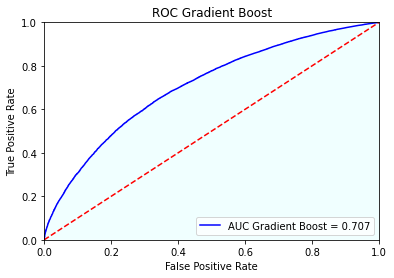

In [64]:
plt.title('ROC Gradient Boost')
plt.plot(fpr_gbc, tpr_gbc, 'blue', label='AUC Gradient Boost = {}'.format(round(roc_auc_gbc,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_gbc, tpr_gbc, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

## Model Comparation

In [65]:
modelComparation = pd.DataFrame({
    "Precision Score": [precision_score(y_test, logreg_grid_pred),precision_score(y_test, dtc_grid_pred),precision_score(y_test, rfc_grid_pred),precision_score(y_test, abc_grid_pred),precision_score(y_test, gbc_random_pred)],
    "Recall Score": [recall_score(y_test, logreg_grid_pred),recall_score(y_test, dtc_grid_pred),recall_score(y_test, rfc_grid_pred),recall_score(y_test, abc_grid_pred),recall_score(y_test, gbc_random_pred)],
    "AUC Score": [roc_auc_logreg,roc_auc_dtc,roc_auc_rfc,roc_auc_abc,roc_auc_gbc]
}, index=['Logistic Regression', 'Decision Tree', 'Random Forest', 'Ada Boost', 'Gradient Boost'])
modelComparation

,Precision Score,Recall Score,AUC Score
Logistic Regression,0.799950,0.999896,0.590791
Decision Tree,0.809133,0.978881,0.688725
Random Forest,0.803702,0.993897,0.701998
Ada Boost,0.803035,0.994798,0.701297
Gradient Boost,0.806261,0.988296,0.706864


In [ ]:
Untuk memilih model yang terbaik digunakan nilai dari AUC yang terbesar dan terpilih Gradiant Boost dengan nilai AUC 0.706864

# Resampling

## 1. SMOTE

In [66]:
# Best Gradient Boost Hyperparameter Tuning
gbcs = GradientBoostingClassifier(learning_rate=0.1,max_depth=10, min_samples_split=2 ,n_estimators=100)
gbcs.fit(X_smo, y_smo)

GradientBoostingClassifier(max_depth=10)

In [67]:
param_random_gbc = {
    'learning_rate': [0.1,0.5],
    'max_depth' : [3, 10],
    'min_samples_split' : [2,5],
    'n_estimators' : [100,200]
}
random_gbc_smo = RandomizedSearchCV(estimator=gbc, param_distributions=param_random_gbc, scoring='roc_auc', n_jobs=-1)
random_gbc_smo.fit(X_train, y_train)

RandomizedSearchCV(estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.5],
                                        'max_depth': [3, 10],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc')

In [68]:
random_gbc_smo.best_params_

{'n_estimators': 100,
 'min_samples_split': 5,
 'max_depth': 3,
 'learning_rate': 0.5}

In [69]:
gbc_smo = random_gbc_smo.best_estimator_

In [70]:
gbc_smo_pred = gbc_smo.predict(X_test)
gbc_smo_proba = gbc_smo.predict_proba(X_test)

In [71]:
print(classification_report(y_test, gbc_smo_pred))

              precision    recall  f1-score   support

           0       0.52      0.05      0.09     14422
           1       0.81      0.99      0.89     57672

    accuracy                           0.80     72094
   macro avg       0.66      0.52      0.49     72094
weighted avg       0.75      0.80      0.73     72094



In [72]:
tngbcs, fpgbcs, fngbcs, tpgbcs = confusion_matrix(y_test, gbc_smo_pred).ravel()
print(confusion_matrix(y_test, gbc_smo_pred))

[[  726 13696]
 [  675 56997]]


In [73]:
gbc_prob_smo = gbc_smo.predict_proba(X_test)
probgbc_smo = gbc_prob_smo[:,1]
fpr_gbc_smo, tpr_gbc_smo, threshold_gbc_smo = roc_curve(y_test, probgbc_smo)
roc_auc_gbc_smo = auc(fpr_gbc_smo, tpr_gbc_smo)

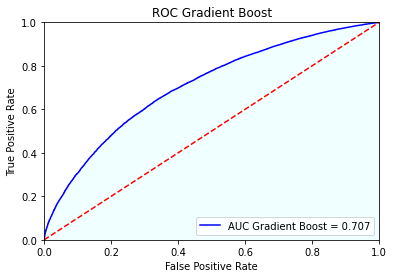

In [74]:
plt.title('ROC Gradient Boost')
plt.plot(fpr_gbc_smo, tpr_gbc_smo, 'blue', label='AUC Gradient Boost = {}'.format(round(roc_auc_gbc_smo,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_gbc_smo, tpr_gbc_smo, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

## 2. Over Sampling

In [75]:
gbcos = GradientBoostingClassifier(learning_rate=0.1,max_depth=10, min_samples_split=2 ,n_estimators=100)
gbcos.fit(X_ros, y_ros)

GradientBoostingClassifier(max_depth=10)

In [76]:
param_random_gbc = {
    'learning_rate': [0.1,0.5],
    'max_depth' : [3, 10],
    'min_samples_split' : [2,5],
    'n_estimators' : [100,200]
}
random_gbc_ros = RandomizedSearchCV(estimator=gbc, param_distributions=param_random_gbc, scoring='roc_auc', n_jobs=-1)
random_gbc_ros.fit(X_ros, y_ros)

RandomizedSearchCV(estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.5],
                                        'max_depth': [3, 10],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc')

In [77]:
random_gbc_ros.best_params_

{'n_estimators': 200,
 'min_samples_split': 5,
 'max_depth': 10,
 'learning_rate': 0.5}

In [78]:
gbc_ros = random_gbc_ros.best_estimator_

In [79]:
gbc_ros_pred = gbc_ros.predict(X_test)
gbc_ros_proba = gbc_ros.predict_proba(X_test)

In [80]:
print(classification_report(y_test, gbc_ros_pred))

              precision    recall  f1-score   support

           0       0.31      0.44      0.36     14422
           1       0.84      0.76      0.80     57672

    accuracy                           0.69     72094
   macro avg       0.58      0.60      0.58     72094
weighted avg       0.74      0.69      0.71     72094



In [81]:
tngbcos, fpgbcos, fngbcos, tpgbcos = confusion_matrix(y_test, gbc_ros_pred).ravel()
print(confusion_matrix(y_test, gbc_ros_pred))

[[ 6318  8104]
 [14125 43547]]


In [82]:
gbc_prob_ros = gbc_ros.predict_proba(X_test)
probgbc_ros = gbc_prob_ros[:,1]
fpr_gbc_ros, tpr_gbc_ros, threshold_gbc_ros = roc_curve(y_test, probgbc_ros)
roc_auc_gbc_ros = auc(fpr_gbc_ros, tpr_gbc_ros)

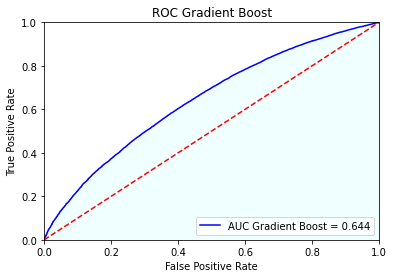

In [83]:
plt.title('ROC Gradient Boost')
plt.plot(fpr_gbc_ros, tpr_gbc_ros, 'blue', label='AUC Gradient Boost = {}'.format(round(roc_auc_gbc_ros,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_gbc_ros, tpr_gbc_ros, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

## 3. Under Sampling

In [84]:
gbcus = GradientBoostingClassifier(learning_rate=0.1,max_depth=10, min_samples_split=2 ,n_estimators=100)
gbcus.fit(X_rus, y_rus)

GradientBoostingClassifier(max_depth=10)

In [85]:
param_random_gbc = {
    'learning_rate': [0.1,0.5],
    'max_depth' : [3, 10],
    'min_samples_split' : [2,5],
    'n_estimators' : [100,200]
}
random_gbc_rus = RandomizedSearchCV(estimator=gbc, param_distributions=param_random_gbc, scoring='roc_auc', n_jobs=-1)
random_gbc_rus.fit(X_rus, y_rus)

RandomizedSearchCV(estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.5],
                                        'max_depth': [3, 10],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc')

In [86]:
random_gbc_rus.best_params_

{'n_estimators': 100,
 'min_samples_split': 5,
 'max_depth': 3,
 'learning_rate': 0.5}

In [87]:
gbc_rus = random_gbc_rus.best_estimator_

In [88]:
gbc_rus_pred = gbc_rus.predict(X_test)
gbc_rus_proba = gbc_rus.predict_proba(X_test)

In [89]:
print(classification_report(y_test, gbc_rus_pred))

              precision    recall  f1-score   support

           0       0.32      0.66      0.43     14422
           1       0.88      0.64      0.74     57672

    accuracy                           0.64     72094
   macro avg       0.60      0.65      0.58     72094
weighted avg       0.77      0.64      0.68     72094



In [90]:
tngbcus, fpgbcus, fngbcus, tpgbcus = confusion_matrix(y_test, gbc_rus_pred).ravel()
print(confusion_matrix(y_test, gbc_rus_pred))

[[ 9555  4867]
 [20777 36895]]


In [92]:
gbc_prob_rus = gbc_rus.predict_proba(X_test)
probgbc_rus = gbc_prob_rus[:,1]
fpr_gbc_rus, tpr_gbc_rus, threshold_gbc_rus = roc_curve(y_test, probgbc_rus)
roc_auc_gbc_rus = auc(fpr_gbc_rus, tpr_gbc_rus)

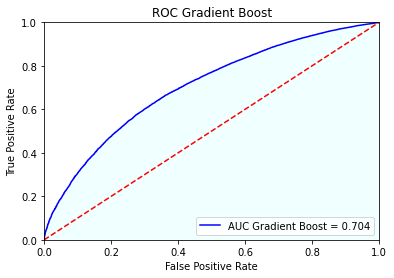

In [93]:
plt.title('ROC Gradient Boost')
plt.plot(fpr_gbc_rus, tpr_gbc_rus, 'blue', label='AUC Gradient Boost = {}'.format(round(roc_auc_gbc_rus,3)))
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.fill_between(fpr_gbc_rus, tpr_gbc_rus, 0, facecolor='azure', alpha=1)
plt.legend(loc='lower right')

## Model Comparation

In [94]:
modelComparation2 = pd.DataFrame({
    "Precision Score": [precision_score(y_test, gbc_random_pred),precision_score(y_test, gbc_smo_pred),precision_score(y_test, gbc_ros_pred),precision_score(y_test, gbc_rus_pred)],
    "Recall Score": [recall_score(y_test, gbc_random_pred),recall_score(y_test, gbc_smo_pred),recall_score(y_test, gbc_ros_pred),recall_score(y_test, gbc_rus_pred)],
    "AUC Score": [roc_auc_gbc,roc_auc_gbc_smo,roc_auc_gbc_ros,roc_auc_gbc_rus]
}, index=['Gradient Boost', 'Gradient Boost SMOTE', 'Gradient Boost Over Sampling', 'Gradient Boost Under Sampling'])
modelComparation2

,Precision Score,Recall Score,AUC Score
Gradient Boost,0.806261,0.988296,0.706864
Gradient Boost SMOTE,0.806261,0.988296,0.706865
Gradient Boost Over Sampling,0.843101,0.755080,0.643880
Gradient Boost Under Sampling,0.883459,0.639739,0.704010


Setelah dilakukan Resampling diperoleh Gradient Boost dengan metode Resampling SMOTE dengan nilai AUC sebesar 0.706965

In [106]:
thres_gbc = pd.DataFrame({'thres': threshold_gbc_smo, 'tpr': tpr_gbc_smo, 'fpr': fpr_gbc_smo})
thres_gbc

,thres,tpr,fpr
0,1.992602,0.000000,0.000000
1,0.992602,0.000017,0.000000
2,0.980898,0.000676,0.000000
3,0.980883,0.000711,0.000000
4,0.980665,0.000832,0.000000
...,...,...,...
28061,0.255572,0.999861,0.999861
28062,0.251657,0.999861,0.999931
28063,0.202897,0.999948,0.999931
28064,0.166320,0.999948,1.000000


In [121]:
prec_score_list = []
recall_score_list = []
for i in thres_gbc['thres'] :
    gbc_pred_ = [0 if x < i else 1 for x in probgbc_smo]
    tngbc_, fpgbc_, fngbc_, tpgbc_ = confusion_matrix(y_test, gbc_pred_).ravel()
    prec_score_list.append(tpgbc_/(tpgbc_+fpgbc_))
    recall_score_list.append(tpgbc_/(tpgbc_+fngbc_))

In [122]:
search_ratio = pd.DataFrame({'thres': thres_gbc['thres'], 'prec_score': prec_score_list, 'recall_score': recall_score_list })
search_ratio

,thres,prec_score,recall_score
0,1.992602,NaN,0.000000
1,0.992602,1.000000,0.000017
2,0.980898,1.000000,0.000676
3,0.980883,1.000000,0.000711
4,0.980665,1.000000,0.000832
...,...,...,...
28061,0.255572,0.799956,0.999861
28062,0.251657,0.799945,0.999861
28063,0.202897,0.799958,0.999948
28064,0.166320,0.799947,0.999948


In [123]:
search_ratio[search_ratio['prec_score']>=0.8]

,thres,prec_score,recall_score
1,0.992602,1.000000,0.000017
2,0.980898,1.000000,0.000676
3,0.980883,1.000000,0.000711
4,0.980665,1.000000,0.000832
5,0.980646,1.000000,0.000867
...,...,...,...
28053,0.314973,0.800086,0.999775
28054,0.302525,0.800019,0.999775
28055,0.301205,0.800022,0.999792
28056,0.293405,0.800000,0.999792


In [124]:
recall_09 = search_ratio[search_ratio['prec_score']>=0.9]['recall_score'].max()
recall_09

0.5313150228880565

In [125]:
tresh_09 = search_ratio[search_ratio['recall_score']==recall_09]['thres'].max()
tresh_09

0.8360775575448294

In [126]:
pred_09 = [0 if x < tresh_09 else 1 for x in probgbc]
confusion_matrix(y_test, pred_09)

array([[11018,  3404],
       [27030, 30642]], dtype=int64)

In [127]:
recall_085 = search_ratio[search_ratio['prec_score']>=0.85]['recall_score'].max()
recall_085

0.8386045221251214

In [128]:
tresh_085 = search_ratio[search_ratio['recall_score']==recall_085]['thres'].max()
tresh_085

0.7116565025507577

In [129]:
pred_085 = [0 if x < tresh_085 else 1 for x in probgbc]
confusion_matrix(y_test, pred_085)

array([[ 5888,  8534],
       [ 9308, 48364]], dtype=int64)

## Joblib

After we done with machine learning modeling. The last step of this stage is to save the model using Joblib. So it can be used for a later stage.

In [130]:
import joblib 

In [131]:
joblib.dump(gbc_smo, 'gbc_smo_LendingClub_Loan')

['gbc_smo_LendingClub_Loan']